# Performance Evaluation 



### Evaluation Methodology
Model execution produces a 1-km grid SWE estimates across the Sierra Nevada Mountains and we can use the Standardized Snow Water Equivalent Evaluation tool (SSWEET) to perform a comphrehensive model evaluation against NASA ASO and snow course surveys.
<img align = 'right' src="./Images/RMSE_R2.JPG" alt = 'image' width = '200'/>

SSWEET uses standard model evaluation metrics to guage model performance (i.e., Percent Bias (PBias, Coefficient of Determination (R2), Kling-Gupta Efficiency (KGE), and root mean squared error (RMSE)) and includes several methods to investitage the impacts of temporal-spatial characteristics influence model skill, ultimately to help refine model skill.
A deep read through [The Abuse of Popular Performance Metrics in Hydrological Modeling](https://agupubs.onlinelibrary.wiley.com/doi/pdf/10.1029/2020WR029001) will provide more insight into model evaluation metrics and how to interpret their results related to model performance.

PBias is a metric communicating the average tendency of the simulated values to be larger or smaller than their observed ones. 
The optimal value of PBias is 0.0, with low-magnitude values indicating accurate model simulation.

The coefficient of determination (R<sup>2</sup>) is a unitless measurement of the proportion of explained variance of the target variable by the model.
A maximum R<sup>2</sup> score of 1.0 indicates the predictor variables explain 100 percent of the variation in the target. 
A greater R<sup>2</sup> and lower RMSE represent better model predictive performance. 

KGE is simply the Euclidean distance computed using the coordinates of bias, standard deviation, and correlation. 
Similar to the coefficient of determination, values closer to 1 indicate greater model skill and due to the calculation of KGE, it will be lower than the bias, standard deviation, and correlation.

RMSE is the quadratic mean of the differences between the observation and predictions, or residuals. 
RMSE aggregate the magnitudes of the residuals for all data points into a single measure of average model predictive power, with RMSE communicating the accuracy of the model.
Note, RMSE is scale dependent.

## Preliminary Model Evaluation
Preliminary model evaluation is on the 25% held out testing data, where the known previous SWE values from NASA ASO flights support the previous SWE feature during model inference.
The following evaulation uses SSWEET to analyze model performance and statistically benchmark improvements compared to the current NSM.

### Model Training/Testing influences and Bias on Model Performance.

The model training/testing partitioning methodology has a strong influence on model performance and the goal of model evaluation.
The objective of the modeling effort was to examine the spatial extrapolation capacity of the model from selected monitoring stations to the overall region, best suited to a 75/25% training/testing split, respectively.

While it is critical to address the strong serial correlation in SWE accumulation and melt throughout the season, the high correlation between weeks has the potential to inflate model skill when using a 75/25% training/testing split due to the previous SWE feature being known.
An assessment of the operational capacity of the model is different than assessing the ability to extrapolate regional SWE from in-situ monitoring stations and is the reason WY 2019 was held out of the training data as it will form the final model validation.


In [2]:
import os
import DataProcess
import SSWEET
#Set working directories
cwd = os.getcwd()
os.chdir("..")
os.chdir("..")
datapath = os.getcwd() 

### Load your model data

As long as model development followed the prescribed template, the SSWEET.load_Predictions() function will correctly load and process model predictions and observations.

In [3]:
RegionTest = SSWEET.load_Predictions(cwd)


In [6]:
RegionTest['N_Sierras']['Date']

index
76b55900-eb3d-4d25-a538-f74302ffe72d   2014-02-18
6dd37e24-0a9c-4749-8ab6-7e26d42925d6   2019-12-24
00c4db22-a423-41a4-ada6-a8b1b04153a4   2018-05-01
76b55900-eb3d-4d25-a538-f74302ffe72d   2017-02-07
147d5eb4-e574-47e4-994a-8a2908c06050   2016-12-20
                                          ...    
147d5eb4-e574-47e4-994a-8a2908c06050   2016-04-26
147d5eb4-e574-47e4-994a-8a2908c06050   2016-03-22
76b55900-eb3d-4d25-a538-f74302ffe72d   2017-01-31
147d5eb4-e574-47e4-994a-8a2908c06050   2018-03-20
147d5eb4-e574-47e4-994a-8a2908c06050   2015-03-31
Name: Date, Length: 250, dtype: datetime64[ns]

## Parity Plot

A parity plot is a scatterplot that compares a set of model estimates against benchmark data, i.e., the observations.
Each point has coordinates (x, y), where x is a benchmark value and y is the corresponding value from the model.
A parity plot is often the first visualization to investigate the skill of a model.

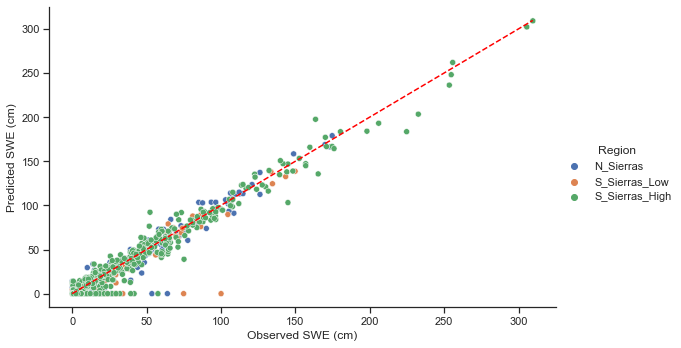

,Region,R2,RMSE,KGE,PBias,R2_fSCA,RMSE_fSCA,KGE_fSCA,PBias_fSCA
0,N_Sierras,0.97,6.28,0.98,0.29,0.95,8.31,0.96,2.46
1,S_Sierras_Low,0.98,3.5,0.96,1.15,0.87,9.15,0.84,13.48
2,S_Sierras_High,0.97,7.63,0.97,-0.32,0.96,9.11,0.95,4.21
3,Sierras_All,0.98,6.47,0.97,0.01,0.95,8.94,0.94,4.92


In [4]:
SSWEET.parityplot(RegionTest)

Model performance is quite high.

## More in-depth model evaluation.
We want to evaluate the model over the course of seasonal snow accumulation and melt, at differnt elevation bands, and spatially.


Using SSWEET, the Model_Vs() function supports an in-depth evaluation of multiple model skill influencing components to conduct a robust and comprehensive evaluation of a model.
The Model_Vs() function takes the following inputs: Model_Vs(RegionTest,variable,Model Output, datapath), where
* RegionTest is the prediction dataframe saved from the training notebook.
* variable is the variable of interest. Currently supported variables include Water Year Week (WYWeek), Elevation (elevation_m), Previous SWE Estimate (prev_SWE), Latitude (Lat), and Northness (northness).
* Model Output refers to one of three model outputs or processed model outputs including: Predictions (Prediction), Error (Error) which is the physical difference between each prediction and observation, and Percent Error (Percent_Error) which is Error divided by the Observation and multiplied by 100%.

The following examples demonstrate the utilty of the SSWEET and the Model_Vs() function.


### Error over time

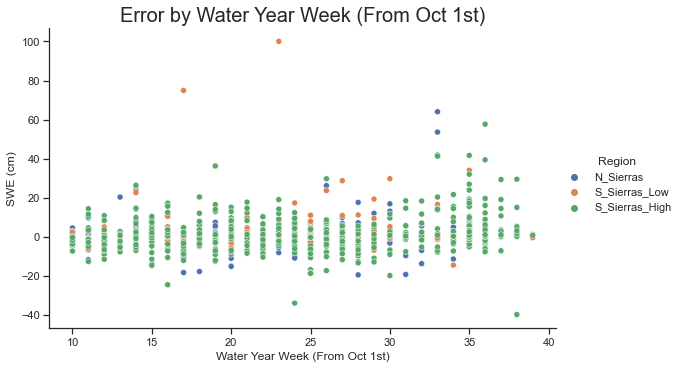

In [4]:
SSWEET.Model_Vs(RegionTest,'WYWeek', 'Error', datapath)

### Error compared to elevation

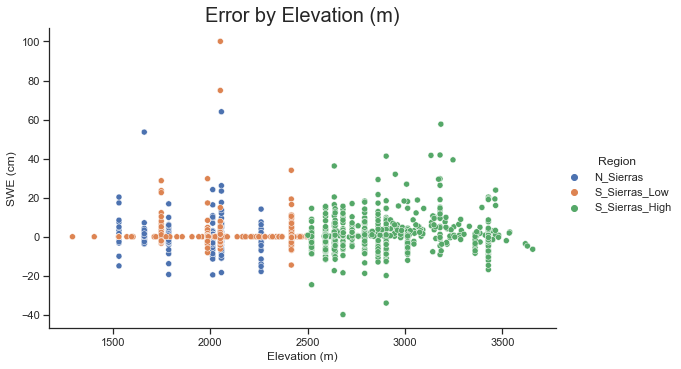

In [5]:
SSWEET.Model_Vs(RegionTest,'elevation_m', 'Error', datapath)

### Percent Error compared to elevation
*note, error greater than |100%| is adjusted to |100%| 

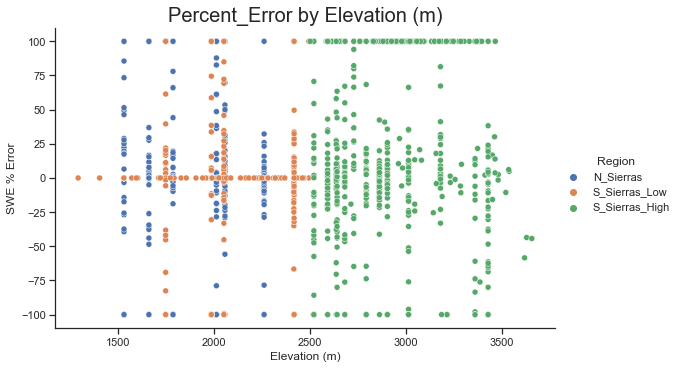

In [6]:
SSWEET.Model_Vs(RegionTest,'elevation_m', 'Percent_Error', datapath)

### Model error  compared to northness


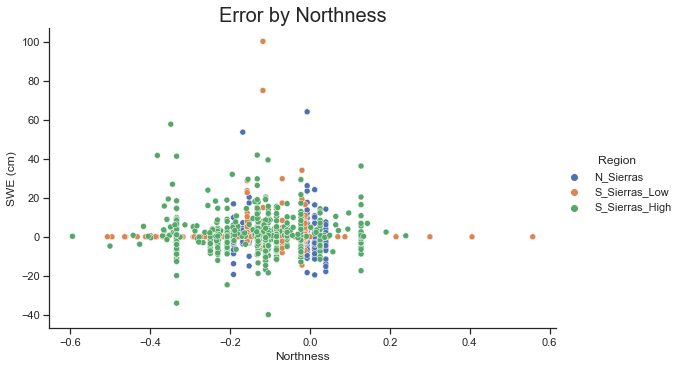

In [7]:
SSWEET.Model_Vs(RegionTest,'northness', 'Error', datapath)

## Interactive Spatial Plotting
While fitures support evaluation, spatially examining model performance has several benefits adn the Map_Plot_Eval function() supports a spatial method to evaluate model skill.
The Map_Plot_Eval(datapath, RegionTest, yaxis, error_metric) function supports three different evaluation metrics: 'KGE', 'cm', or '%'.
The physical error (cm) illustrates how close the predictions are to the observed, the mean percentage error (%) illustrates the perentagewise prediction accuracy, and KGE (KGE) illustrates the mean, variance and correlation on model performance, however, it is only useful for sites with multiple predictions. 

### Spatially evaluating the Model via KGE
Selecting the prediction where there was a previous SWE value demonstrates significanly increased KGE. Note, the blue icons are the SNOTEL sites used to inform predictions and are more visible now. 
When running interactively, clicking on the SNOTEL icon shows the SNOTEL site information and allwos for an investigation of errors stemming from the proximity of the prediction locations to in situ observations.



In [3]:
#Folium plot
SSWEET.Map_Plot_Eval(datapath, RegionTest,'SWE (cm)', 'KGE')

Processing Dataframe into timeseries format: predictions, observations, error.


100%|██████████| 1075/1075 [00:02<00:00, 418.81it/s]


Plotting monitoring station locations


,Observations,Predictions,Errors
Date,,,
2013-01-08,39.116,12.790700,26.325300
2014-04-08,13.970,18.589613,-4.619613
2014-04-22,12.700,7.472260,5.227740
2015-12-22,15.240,15.779408,-0.539408
2016-02-09,46.736,32.767857,13.968143
2016-03-08,59.944,40.937031,19.006969
2016-05-03,39.624,39.952789,-0.328789
2017-01-10,59.944,45.303978,14.640022
2017-01-24,96.520,84.036339,12.483661


,Observations,Predictions,Errors
Date,,,
2013-01-08,8.382,5.311487,3.070513
2013-01-29,13.716,11.495456,2.220544
2013-02-19,14.478,9.167174,5.310826
2013-03-19,7.112,2.109181,5.002819
2013-05-07,0.762,0.000000,0.762000
2013-12-31,1.778,1.245508,0.532492
2014-01-07,2.794,0.497477,2.296523
2014-01-21,1.016,0.000000,1.016000
2014-02-04,3.556,0.000000,3.556000


,Observations,Predictions,Errors
Date,,,
2013-01-08,22.606,24.894638,-2.288638
2013-02-19,23.114,22.341661,0.772339
2013-04-02,11.684,10.414615,1.269385
2013-04-16,0.000,0.605664,-0.605664
2013-05-21,0.000,0.000000,0.000000
2013-06-04,0.000,0.000000,0.000000
2013-06-18,0.000,0.000000,0.000000
2014-02-04,2.286,5.667263,-3.381263
2014-03-04,3.302,6.030589,-2.728589


,Observations,Predictions,Errors
Date,,,
2013-01-08,94.996,92.054459,2.941541
2013-01-22,98.044,97.658081,0.385919
2013-04-16,122.682,135.374161,-12.692161
2013-05-28,60.452,57.672249,2.779751
2013-06-04,32.766,37.921875,-5.155875
2013-12-17,12.192,17.212336,-5.020336
2014-01-14,14.478,15.795620,-1.317620
2014-02-25,41.656,33.373569,8.282431
2014-04-22,59.944,72.887436,-12.943436


,Observations,Predictions,Errors
Date,,,
2013-01-08,39.624,43.494778,-3.870778
2013-01-29,42.926,45.801846,-2.875846
2013-02-19,43.180,44.280228,-1.100228
2013-02-26,44.704,45.556297,-0.852297
2013-03-05,42.926,46.023964,-3.097964
2013-03-12,49.022,51.805878,-2.783878
2013-05-28,0.000,0.231974,-0.231974
2013-06-04,0.000,0.000000,0.000000
2013-06-25,0.000,0.000000,0.000000


,Observations,Predictions,Errors
Date,,,
2013-01-08,40.132,33.370403,6.761597
2013-01-15,40.894,33.611797,7.282203
2013-02-26,44.958,49.067974,-4.109974
2013-05-07,1.270,2.090485,-0.820485
2013-05-21,1.270,5.189789,-3.919789
2013-06-04,1.778,0.000000,1.778000
2013-06-11,1.270,0.000000,1.270000
2013-06-18,1.016,0.000000,1.016000
2014-01-14,5.588,6.231987,-0.643987


,Observations,Predictions,Errors
Date,,,
2013-01-15,19.558,23.977728,-4.419728
2013-01-22,19.558,26.878508,-7.320508
2013-03-05,42.926,44.520123,-1.594123
2013-04-02,44.450,35.838310,8.611690
2013-05-21,20.320,11.990131,8.329869
2013-05-28,20.066,12.394475,7.671525
2013-06-11,19.558,12.358048,7.199952
2013-06-18,19.050,9.792701,9.257299
2013-12-24,10.414,10.150388,0.263612


,Observations,Predictions,Errors
Date,,,
2013-01-15,36.830,28.435087,8.394913
2013-02-05,39.116,39.093014,0.022986
2013-03-05,41.402,45.919250,-4.517250
2013-04-23,19.304,23.052317,-3.748317
2013-12-17,6.604,9.946623,-3.342623
2013-12-24,7.366,10.606672,-3.240672
2014-03-04,35.560,39.229069,-3.669069
2014-03-18,35.306,40.252007,-4.946007
2014-04-15,26.670,34.853249,-8.183249


,Observations,Predictions,Errors
Date,,,
2013-01-15,57.150,46.764568,10.385432
2013-02-05,62.738,64.382011,-1.644011
2013-02-19,57.150,64.842377,-7.692377
2013-02-26,56.388,63.405064,-7.017064
2013-03-19,65.024,61.209637,3.814363
2013-03-26,64.516,70.820656,-6.304656
2013-04-16,46.736,56.696590,-9.960590
2013-04-23,38.862,41.675903,-2.813903
2014-02-04,6.604,4.988199,1.615801


,Observations,Predictions,Errors
Date,,,
2013-01-22,56.388,56.625118,-0.237118
2013-02-12,60.960,59.840069,1.119931
2013-03-26,71.882,65.070068,6.811932
2013-04-02,71.374,64.709602,6.664398
2013-06-25,1.016,0.515499,0.500501
2013-12-31,3.302,2.638870,0.663130
2014-02-18,19.304,17.136173,2.167827
2014-03-11,27.940,36.071808,-8.131808
2014-04-01,39.370,47.125195,-7.755195


,Observations,Predictions,Errors
Date,,,
2013-01-22,51.308,53.725945,-2.417945
2013-01-29,54.356,54.065769,0.290231
2013-04-02,42.672,42.140808,0.531192
2013-04-23,19.304,15.339925,3.964075
2014-02-18,20.066,23.697460,-3.631460
2014-03-18,30.226,33.484661,-3.258661
2014-03-25,28.702,31.680950,-2.978950
2014-04-15,27.686,23.453289,4.232711
2014-12-09,4.064,6.771894,-2.707894


,Observations,Predictions,Errors
Date,,,
2013-01-22,28.702,32.333591,-3.631591
2013-02-12,22.860,25.504248,-2.644248
2013-03-05,22.098,18.623018,3.474982
2013-03-12,24.892,16.502911,8.389089
2013-05-14,2.286,0.582979,1.703021
2013-06-18,1.016,0.340644,0.675356
2014-01-21,0.000,2.577846,-2.577846
2014-02-18,2.032,7.885834,-5.853834
2014-04-22,0.000,0.985344,-0.985344


,Observations,Predictions,Errors
Date,,,
2013-02-05,4.318,7.724759,-3.406759
2013-02-19,1.524,0.185333,1.338667
2013-03-12,0.254,5.715809,-5.461809
2013-04-02,0.000,0.000000,0.000000
2014-02-11,10.668,9.233257,1.434743
2014-02-25,3.302,2.036728,1.265272
2014-03-11,18.288,22.644039,-4.356039
2014-03-25,4.064,8.555988,-4.491988
2014-04-15,13.970,33.516552,-19.546552


,Observations,Predictions,Errors
Date,,,
2013-02-05,53.340,49.865936,3.474064
2013-04-23,0.000,0.000000,0.000000
2013-05-07,0.000,0.000000,0.000000
2013-12-17,3.556,1.907980,1.648020
2013-12-24,1.524,1.128571,0.395429
2014-01-14,0.254,1.578662,-1.324662
2014-02-11,14.986,7.601553,7.384447
2014-02-18,5.588,7.677311,-2.089311
2014-04-08,10.160,7.223153,2.936847


,Observations,Predictions,Errors
Date,,,
2013-02-05,21.082,24.091467,-3.009467
2013-02-26,26.924,24.637835,2.286165
2013-03-26,9.144,9.150400,-0.006400
2013-06-04,1.524,0.423425,1.100575
2013-12-24,5.588,6.499641,-0.911641
2014-01-07,3.810,5.074781,-1.264781
2014-02-04,7.112,4.646950,2.465050
2014-02-11,9.144,10.188501,-1.044501
2014-03-18,1.778,6.032326,-4.254326


,Observations,Predictions,Errors
Date,,,
2013-02-12,8.636,15.852710,-7.216710
2013-02-26,8.636,17.097868,-8.461868
2013-03-05,8.890,15.453362,-6.563362
2013-03-19,8.890,7.631777,1.258223
2013-12-17,4.826,6.250119,-1.424119
2014-01-21,5.842,5.106521,0.735479
2014-02-25,10.160,10.778322,-0.618322
2015-01-06,0.762,4.860741,-4.098741
2015-01-27,0.762,4.207011,-3.445011


,Observations,Predictions,Errors
Date,,,
2013-02-26,25.908,29.612928,-3.704928
2013-03-26,21.336,21.639658,-0.303658
2013-05-07,2.794,2.435417,0.358583
2013-05-28,2.794,2.965466,-0.171466
2013-06-04,3.048,1.026281,2.021719
2013-06-18,2.794,2.377186,0.416814
2013-12-24,9.398,8.481462,0.916538
2013-12-31,10.160,8.267345,1.892655
2014-01-21,10.160,6.557351,3.602649


,Observations,Predictions,Errors
Date,,,
2013-02-26,68.834,73.379715,-4.545715
2013-03-12,77.216,76.611237,0.604763
2013-12-10,7.874,11.539666,-3.665666
2013-12-24,9.652,13.665965,-4.013965
2014-01-14,12.192,12.670155,-0.478155
2014-03-11,53.594,52.471127,1.122873
2014-03-18,56.134,58.149426,-2.015426
2014-04-01,65.278,63.143425,2.134575
2014-04-29,42.418,32.831905,9.586095


,Observations,Predictions,Errors
Date,,,
2013-02-26,44.196,40.791744,3.404256
2013-03-12,51.308,48.407745,2.900255
2013-03-26,39.878,39.069542,0.808458
2013-06-04,0.000,0.302741,-0.302741
2013-06-25,0.254,0.000000,0.254000
2014-01-07,9.652,8.055337,1.596663
2014-03-18,1.524,0.000000,1.524000
2014-03-25,0.762,1.035780,-0.273780
2014-04-08,3.810,2.406116,1.403884


,Observations,Predictions,Errors
Date,,,
2013-03-26,25.908,22.654758,3.253242
2013-04-16,14.732,9.972472,4.759528
2013-04-23,9.398,5.975196,3.422804
2013-05-21,0.000,0.718039,-0.718039
2013-05-28,0.000,0.708492,-0.708492
2013-06-11,0.000,0.752336,-0.752336
2013-12-10,2.540,2.728259,-0.188259
2013-12-17,2.540,3.352692,-0.812692
2014-01-07,4.064,4.523890,-0.459890


,Observations,Predictions,Errors
Date,,,
2013-04-30,88.392,85.899361,2.492639
2013-12-24,19.558,19.743305,-0.185305
2014-01-21,21.336,19.137611,2.198389
2014-02-04,35.052,14.694554,20.357446
2014-02-11,75.184,38.948921,36.235079
2014-04-01,106.426,99.563828,6.862172
2014-04-15,100.584,95.052895,5.531105
2014-12-23,39.116,28.332344,10.783656
2014-12-30,41.656,44.226704,-2.570704


,Observations,Predictions,Errors
Date,,,
2013-05-28,0.762,0.000000,0.762000
2013-12-17,8.128,8.521689,-0.393689
2014-01-07,9.144,10.151879,-1.007879
2014-01-14,10.668,8.974194,1.693806
2014-02-11,15.748,14.424715,1.323285
2014-02-18,25.146,27.871147,-2.725147
2014-04-08,40.894,38.690331,2.203669
2014-06-17,0.000,0.282540,-0.282540
2014-12-09,14.986,14.078136,0.907864


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.151080,-0.151080
2013-06-08,0.0,0.242736,-0.242736


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,30.226,26.294001,3.931999


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,32.258,28.888588,3.369412


,Observations,Predictions,Errors
Date,,,
2013-06-01,2.540,6.825289,-4.285289
2013-06-08,0.508,3.760249,-3.252249


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.325093,-0.325093


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.212859,-0.212859


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.254,2.004448,-1.750448
2013-06-08,0.254,0.946958,-0.692958


,Observations,Predictions,Errors
Date,,,
2013-06-01,27.94,22.927563,5.012437


,Observations,Predictions,Errors
Date,,,
2013-06-01,9.398,10.878858,-1.480858


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.316538,-0.316538


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.019283,-0.019283
2013-06-08,0.0,0.000000,0.000000


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.014402,-0.014402


,Observations,Predictions,Errors
Date,,,
2013-06-01,28.194,32.018093,-3.824093


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.000000,0.000000
2013-06-08,0.0,0.004142,-0.004142


,Observations,Predictions,Errors
Date,,,
2013-06-01,8.636,6.146095,2.489905


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.168637,-0.168637


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.060103,-0.060103


,Observations,Predictions,Errors
Date,,,
2013-06-01,5.588,5.450322,0.137678


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.762,2.387294,-1.625294


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.025377,-0.025377


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.194988,-0.194988
2013-06-08,0.0,0.115165,-0.115165


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.128493,-0.128493


,Observations,Predictions,Errors
Date,,,
2013-06-01,9.398,7.133706,2.264294
2013-06-08,3.556,5.305733,-1.749733


,Observations,Predictions,Errors
Date,,,
2013-06-01,9.906,9.474839,0.431161
2013-06-08,4.826,6.157313,-1.331313


,Observations,Predictions,Errors
Date,,,
2013-06-01,6.096,4.733483,1.362517
2013-06-08,1.778,3.202619,-1.424619


,Observations,Predictions,Errors
Date,,,
2013-06-01,23.114,20.04508,3.06892
2013-06-08,12.446,14.82792,-2.38192


,Observations,Predictions,Errors
Date,,,
2013-06-01,6.096,9.660213,-3.564213


,Observations,Predictions,Errors
Date,,,
2013-06-01,8.382,8.872380,-0.490380
2013-06-08,1.270,4.473199,-3.203199


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.762,0.92007,-0.15807


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,4.064,6.03233,-1.96833


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.236708,-0.236708


,Observations,Predictions,Errors
Date,,,
2013-06-01,64.262,44.910629,19.351371


,Observations,Predictions,Errors
Date,,,
2013-06-01,2.794,3.127173,-0.333173


,Observations,Predictions,Errors
Date,,,
2013-06-01,32.004,28.801197,3.202803


,Observations,Predictions,Errors
Date,,,
2013-06-01,41.656,25.692217,15.963783


,Observations,Predictions,Errors
Date,,,
2013-06-01,2.286,2.188387,0.097613
2013-06-08,0.508,0.633035,-0.125035


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,4.826,6.333786,-1.507786


,Observations,Predictions,Errors
Date,,,
2013-06-01,32.004,22.085855,9.918145


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.508,1.607683,-1.099683


,Observations,Predictions,Errors
Date,,,
2013-06-01,13.208,14.636833,-1.428833
2013-06-08,8.890,10.234573,-1.344573


,Observations,Predictions,Errors
Date,,,
2013-06-01,10.16,7.966687,2.193313


,Observations,Predictions,Errors
Date,,,
2013-06-01,2.794,4.505589,-1.711589


,Observations,Predictions,Errors
Date,,,
2013-06-01,7.62,7.936008,-0.316008


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.179804,-0.179804


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.762,3.471463,-2.709463


,Observations,Predictions,Errors
Date,,,
2013-06-01,15.494,19.240368,-3.746368


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.000089,-0.000089


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.054863,-0.054863


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.234298,-0.234298


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.018969,-0.018969


,Observations,Predictions,Errors
Date,,,
2013-06-01,9.144,9.683733,-0.539733


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,8.636,7.340601,1.295399


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,31.496,30.701067,0.794933


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.762,1.003278,-0.241278


,Observations,Predictions,Errors
Date,,,
2013-06-01,26.924,17.535543,9.388457


,Observations,Predictions,Errors
Date,,,
2013-06-01,18.288,12.68404,5.60396


,Observations,Predictions,Errors
Date,,,
2013-06-01,22.352,21.517088,0.834912
2013-06-08,23.368,20.128040,3.239960


,Observations,Predictions,Errors
Date,,,
2013-06-01,30.988,29.089472,1.898528


,Observations,Predictions,Errors
Date,,,
2013-06-01,6.35,13.954336,-7.604336


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.380202,-0.380202
2013-06-08,0.0,0.324094,-0.324094


,Observations,Predictions,Errors
Date,,,
2013-06-01,2.032,2.225451,-0.193451


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.044376,-0.044376


,Observations,Predictions,Errors
Date,,,
2013-06-01,17.78,14.799959,2.980041


,Observations,Predictions,Errors
Date,,,
2013-06-01,23.876,25.766554,-1.890554
2013-06-08,16.002,21.720169,-5.718169


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.0,0.0
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-01,5.334,6.453393,-1.119393


,Observations,Predictions,Errors
Date,,,
2013-06-01,24.892,19.751854,5.140146


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.508,0.0,0.508


,Observations,Predictions,Errors
Date,,,
2013-06-01,3.556,6.264148,-2.708148


,Observations,Predictions,Errors
Date,,,
2013-06-01,18.034,14.806184,3.227816


,Observations,Predictions,Errors
Date,,,
2013-06-01,10.922,15.684278,-4.762278


,Observations,Predictions,Errors
Date,,,
2013-06-01,39.116,38.306004,0.809996


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.254427,-0.254427


,Observations,Predictions,Errors
Date,,,
2013-06-01,19.05,19.341413,-0.291413


,Observations,Predictions,Errors
Date,,,
2013-06-01,13.97,14.122112,-0.152112


,Observations,Predictions,Errors
Date,,,
2013-06-01,18.796,21.86751,-3.07151


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.402144,-0.402144


,Observations,Predictions,Errors
Date,,,
2013-06-01,7.366,7.741803,-0.375803


,Observations,Predictions,Errors
Date,,,
2013-06-01,25.146,24.801765,0.344235


,Observations,Predictions,Errors
Date,,,
2013-06-01,2.286,5.570379,-3.284379


,Observations,Predictions,Errors
Date,,,
2013-06-01,10.414,11.986115,-1.572115
2013-06-08,6.096,6.967908,-0.871908


,Observations,Predictions,Errors
Date,,,
2013-06-01,43.942,40.733307,3.208693


,Observations,Predictions,Errors
Date,,,
2013-06-01,4.826,6.099690,-1.273690
2013-06-08,1.778,4.655435,-2.877435


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.0,0.117686,-0.117686


,Observations,Predictions,Errors
Date,,,
2013-06-01,8.89,5.254556,3.635444


,Observations,Predictions,Errors
Date,,,
2013-06-01,0.762,1.528884,-0.766884


,Observations,Predictions,Errors
Date,,,
2013-06-01,15.748,12.040343,3.707657
2013-06-08,10.668,7.591109,3.076891


,Observations,Predictions,Errors
Date,,,
2013-06-01,19.05,21.068691,-2.018691


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.284664,-0.284664


,Observations,Predictions,Errors
Date,,,
2013-06-08,1.778,3.746092,-1.968092


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.170755,-0.170755


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.043055,-0.043055


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.180962,-0.180962


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.206467,-0.206467


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.597061,-0.597061


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.146592,-0.146592


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.762,3.053782,-2.291782


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.018068,-0.018068


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.000053,-0.000053


,Observations,Predictions,Errors
Date,,,
2013-06-08,57.658,57.940983,-0.282983


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.184707,-0.184707


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.336632,-0.336632


,Observations,Predictions,Errors
Date,,,
2013-06-08,6.858,12.721985,-5.863985


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.119601,-0.119601


,Observations,Predictions,Errors
Date,,,
2013-06-08,3.048,4.29985,-1.25185


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.043471,-0.043471


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.762,3.736855,-2.974855


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,1.384869,-1.130869


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,0.163823,0.090177


,Observations,Predictions,Errors
Date,,,
2013-06-08,2.286,3.957485,-1.671485


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.762,4.327895,-3.565895


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,0.83739,-0.58339


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,0.745154,-0.491154


,Observations,Predictions,Errors
Date,,,
2013-06-08,22.098,23.007257,-0.909257


,Observations,Predictions,Errors
Date,,,
2013-06-08,5.588,8.508805,-2.920805


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.508,2.357738,-1.849738


,Observations,Predictions,Errors
Date,,,
2013-06-08,12.192,14.759285,-2.567285


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,0.925804,-0.671804


,Observations,Predictions,Errors
Date,,,
2013-06-08,30.226,37.922901,-7.696901


,Observations,Predictions,Errors
Date,,,
2013-06-08,6.096,11.160302,-5.064302


,Observations,Predictions,Errors
Date,,,
2013-06-08,4.064,11.214414,-7.150414


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,2.128397,-1.874397


,Observations,Predictions,Errors
Date,,,
2013-06-08,3.556,4.349761,-0.793761


,Observations,Predictions,Errors
Date,,,
2013-06-08,1.27,3.776012,-2.506012


,Observations,Predictions,Errors
Date,,,
2013-06-08,14.478,20.893803,-6.415803


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.762,0.907883,-0.145883


,Observations,Predictions,Errors
Date,,,
2013-06-08,39.37,35.550774,3.819226


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.508,1.691357,-1.183357


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,1.948525,-1.694525


,Observations,Predictions,Errors
Date,,,
2013-06-08,6.604,13.83326,-7.22926


,Observations,Predictions,Errors
Date,,,
2013-06-08,49.784,47.370079,2.413921


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.762,1.617198,-0.855198


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.508,0.649341,-0.141341


,Observations,Predictions,Errors
Date,,,
2013-06-08,5.334,4.993626,0.340374


,Observations,Predictions,Errors
Date,,,
2013-06-08,2.54,2.529537,0.010463


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,3.374448,-3.120448


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.0,0.0


,Observations,Predictions,Errors
Date,,,
2013-06-08,6.096,7.445093,-1.349093


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.417188,-0.417188


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.408379,-0.408379


,Observations,Predictions,Errors
Date,,,
2013-06-08,3.556,8.0776,-4.5216


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.240801,-0.240801


,Observations,Predictions,Errors
Date,,,
2013-06-08,1.778,4.162317,-2.384317


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.0,0.096994,-0.096994


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.254,1.620442,-1.366442


,Observations,Predictions,Errors
Date,,,
2013-06-08,1.016,0.983068,0.032932


,Observations,Predictions,Errors
Date,,,
2013-06-08,4.826,5.669216,-0.843216


,Observations,Predictions,Errors
Date,,,
2013-06-08,0.508,4.322164,-3.814164


,Observations,Predictions,Errors
Date,,,
2013-06-08,15.24,15.745658,-0.505658


,Observations,Predictions,Errors
Date,,,
2013-12-17,0.254,12.970324,-12.716324
2014-02-11,0.508,13.122791,-12.614791
2014-04-15,0.508,9.147039,-8.639039
2014-04-22,0.254,11.249214,-10.995214
2014-12-16,30.226,32.667736,-2.441736
2014-12-30,36.830,35.532570,1.297430
2015-01-06,36.576,35.826382,0.749618
2015-01-13,37.592,33.869801,3.722199
2015-03-10,53.340,52.340256,0.999744


,Observations,Predictions,Errors
Date,,,
2014-01-07,8.128,6.348713,1.779287
2014-01-14,7.874,5.858247,2.015753
2014-02-04,14.478,6.597376,7.880624
2014-05-13,0.254,0.000000,0.254000
2014-05-27,0.254,0.000000,0.254000
2014-12-23,8.636,13.596504,-4.960504
2014-12-30,11.430,13.746936,-2.316936
2015-01-06,9.144,13.271364,-4.127364
2015-02-24,9.398,8.124883,1.273117


,Observations,Predictions,Errors
Date,,,
2016-06-14,14.478,21.891804,-7.413804


,Observations,Predictions,Errors
Date,,,
2016-06-14,10.668,15.329308,-4.661308


,Observations,Predictions,Errors
Date,,,
2016-06-14,3.556,7.294293,-3.738293
2016-06-21,1.524,0.000000,1.524000


,Observations,Predictions,Errors
Date,,,
2016-06-14,3.048,6.747761,-3.699761


,Observations,Predictions,Errors
Date,,,
2016-06-21,14.986,12.987136,1.998864


,Observations,Predictions,Errors
Date,,,
2016-06-21,29.464,24.359821,5.104179


,Observations,Predictions,Errors
Date,,,
2016-06-21,5.08,3.117547,1.962453


,Observations,Predictions,Errors
Date,,,
2016-06-21,5.334,6.653515,-1.319515


,Observations,Predictions,Errors
Date,,,
2016-06-21,0.254,0.0,0.254


### Spatially evaluating the Model via error in percentage from the observed

We can now see that the model can spatially extrapolate and that there is a significant need for improved temporal resolution data. 
For this case, KGE does not provide a useful method to evaluate the model.
Alternatively, the Map_Plot_Eval() function supports percent error (%) and physical error (cm).

In [9]:
#Folium plot
SSWEET.Map_Plot_Eval(datapath, RegionTest,'SWE (cm)', '%')

Processing Dataframe into timeseries format: predictions, observations, error.


100%|██████████| 1075/1075 [00:02<00:00, 465.14it/s]


Plotting monitoring station locations


### Spatially evaluating the Model via error in cm




In [10]:
#Folium plot
SSWEET.Map_Plot_Eval(datapath, RegionTest,'SWE (cm)', 'cm')

Processing Dataframe into timeseries format: predictions, observations, error.


100%|██████████| 1075/1075 [00:02<00:00, 473.07it/s]


Plotting monitoring station locations


### Other examples of using SSWEET to investigate model performance

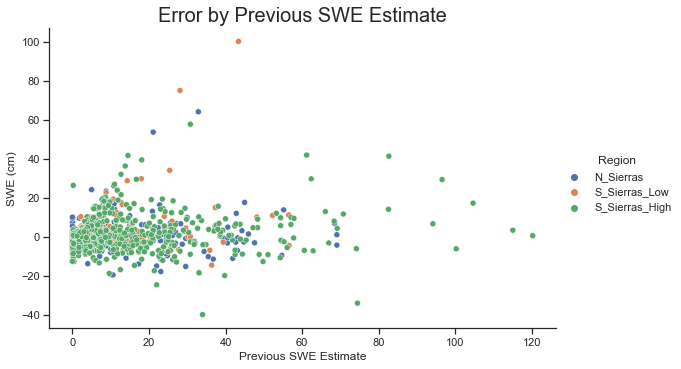

In [11]:
SSWEET.Model_Vs(RegionTest,'prev_SWE', 'Error', datapath)

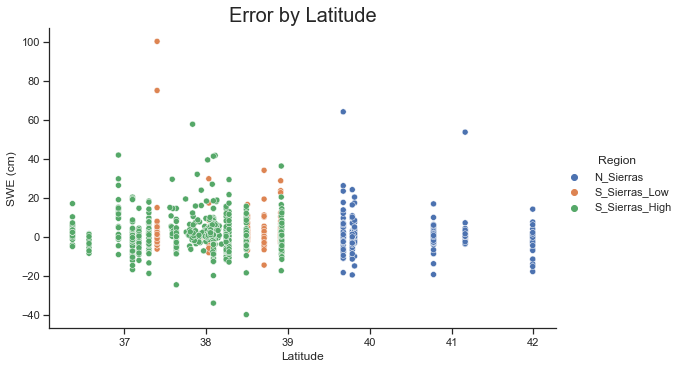

In [12]:
SSWEET.Model_Vs(RegionTest,'Lat', 'Error', datapath)

## More In-Depth Model Evaluation
Lets look at the predictions that have a previous week's value and evaluate how the model performs.


In [13]:
#Investigate how a model input relates to model performance
RegionTest_PSWE = {}
Regions = list(RegionTest.keys())
for Region in Regions:
    RegionTest_PSWE[Region] = RegionTest[Region][RegionTest[Region]['prev_SWE']>=0]

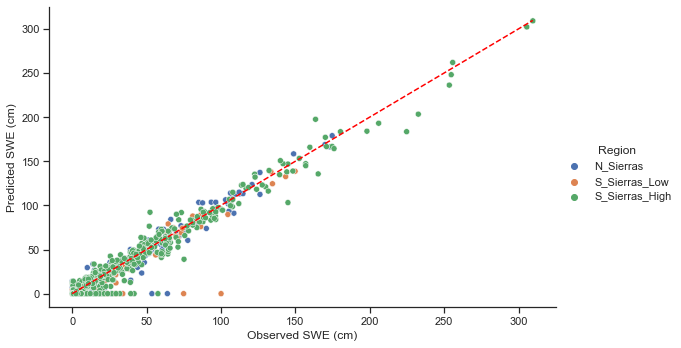

,Region,R2,RMSE,KGE,PBias,R2_fSCA,RMSE_fSCA,KGE_fSCA,PBias_fSCA
0,N_Sierras,0.97,6.28,0.98,0.29,0.95,8.31,0.96,2.46
1,S_Sierras_Low,0.98,3.5,0.96,1.15,0.87,9.15,0.84,13.48
2,S_Sierras_High,0.97,7.63,0.97,-0.32,0.96,9.11,0.95,4.21
3,Sierras_All,0.98,6.47,0.97,0.01,0.95,8.94,0.94,4.92


In [14]:
SSWEET.parityplot(RegionTest_PSWE)

## Greatly improved modeling performorance!!



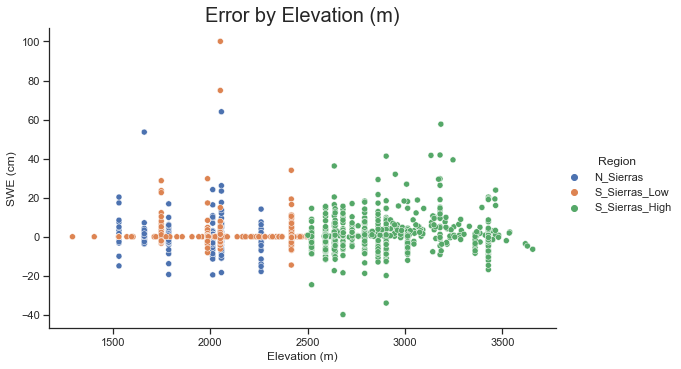

In [15]:
SSWEET.Model_Vs(RegionTest_PSWE,'elevation_m', 'Error', datapath)

### There is a small bias in error, increasing at higher elevations

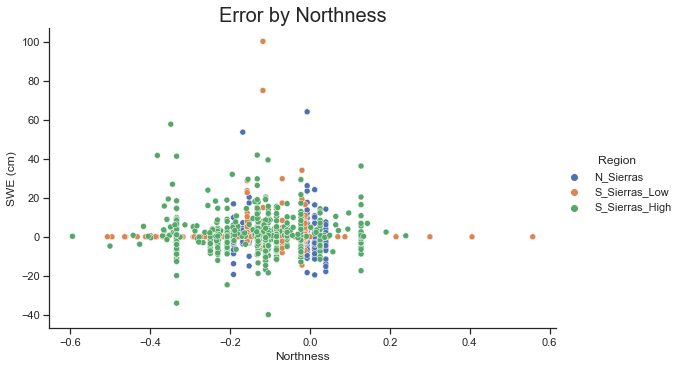

In [16]:
SSWEET.Model_Vs(RegionTest_PSWE,'northness', 'Error', datapath)

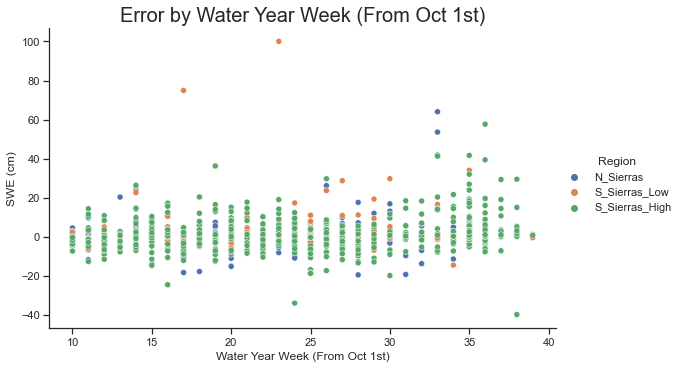

In [17]:
SSWEET.Model_Vs(RegionTest_PSWE,'WYWeek', 'Error', datapath)

## Lets look at the errors spatially again

In [18]:
#Run folium plotting function
SSWEET.Map_Plot_Eval(datapath, RegionTest_PSWE,'SWE (cm)', 'cm')

Processing Dataframe into timeseries format: predictions, observations, error.


100%|██████████| 1075/1075 [00:02<00:00, 471.00it/s]


Plotting monitoring station locations


## Exploring the Prediction results

While model error is a critical metric to gauge model skil, simple checks on model predictions can support the use of a model or high areas for improvement.
For example, it montane regions, SWE generally increases in elevation up to the apline (or above treeline). 
Capturing this trend is important and a critical element of model evaluation.
Once above treeline (~2,900 m in the Sierra Nevada mountains), SWE distribution is significantly affected by overall and microclimate wind speed and direction, leaving some high altitude regions completly bare and others with large amounts of SWE. 
Note, many of these aspects are scale dependent (e.g., a 50 m, 250 m, 1 km, and 25 km model will vary significantly due to varying geopatial characteristics and key hydrological processes).


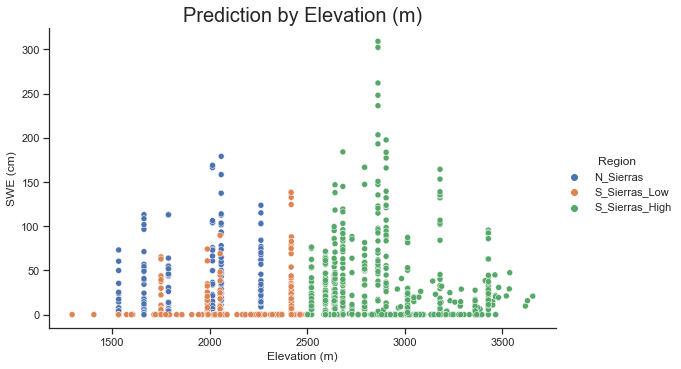

In [19]:
SSWEET.Model_Vs(RegionTest,'elevation_m', 'Prediction', datapath)

Effective modeling of elevation gradients leads to a realistic modeled SWE across heterogeneous terrain. 
For example, the  higher elevation bands display greater modeled SWE values compared to lower elevations, and the highest elevation bands display less SWE reflecting exposed terrain subject to wind transport and snow redistribution.
This is indicative that the model is capable of generalizing topographical and geographical characteristics to effectivley translate elevation gradients on SWE.


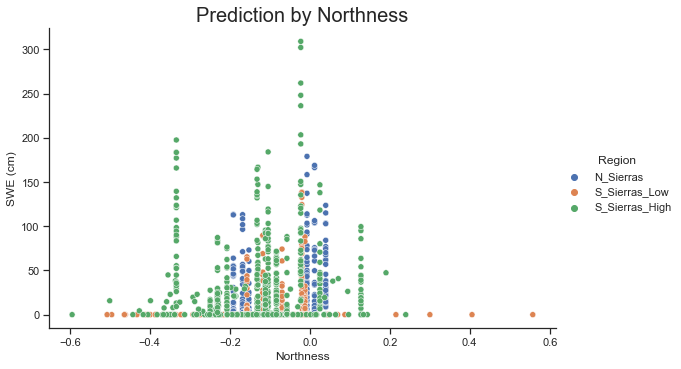

In [20]:
SSWEET.Model_Vs(RegionTest,'northness', 'Prediction', datapath)

While the model uses northness as a feature to represent the average slope and aspect of the 1-km grid, overlaying the predictions on complex topography indicates a need for high resolution prediction.
Examination of the 1-km resolution indicates it is too coarse to capture rapid topographical changes common to montane environments, but does indicate an increas in northness lead to an increase in SWE.
Investigating the distribution of observation/predictions indicates there is a need to a larger, more comprehensive training dataset to capture key influences on SWE distribution in montane environments. 

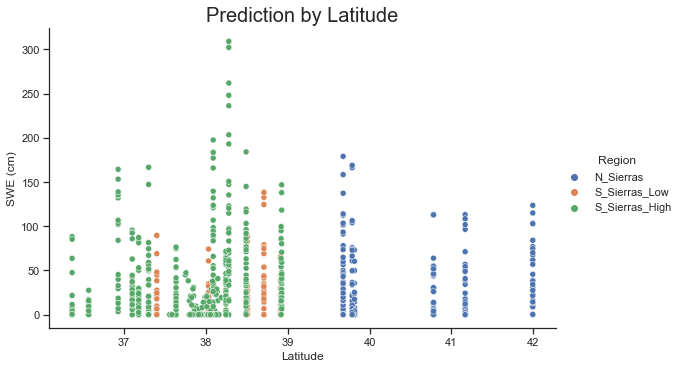

In [21]:
SSWEET.Model_Vs(RegionTest,'Lat', 'Prediction', datapath)